In [1]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.formula.api as smf

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression

In [17]:
stroke=pd.read_csv(r"C:\Users\2031\Desktop\healthcare-dataset-stroke-data.csv")
stroke

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


In [18]:
#1) id: unique identifier
#2) gender: "Male", "Female" or "Other"
#3) age: age of the patient
#4) hypertension: 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
#5) heart_disease: 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
#6) ever_married: "No" or "Yes"
#7) work_type: "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"
#8) Residence_type: "Rural" or "Urban"
#9) avg_glucose_level: average glucose level in blood
#10) bmi: body mass index-->>Underweight = <18.5
#>>Normal weight = 18.5–24.9
#>>Overweight = 25–29.9
#>>Obesity = BMI of 30 or greater
#11) smoking_status: "formerly smoked", "never smoked", "smokes" or "Unknown"*
#12) stroke: 1 if the patient had a stroke or 0 if not
#*Note: "Unknown" in smoking_status means that the information is unavailable for this patient


In [19]:
stroke.shape

(5110, 12)

In [20]:
stroke.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [21]:
stroke.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [22]:
stroke.isnull().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [23]:
unavailable_data=round(((stroke.isnull().sum()/stroke.isnull().count()*100)))

In [24]:
unavailable_data

id                   0.0
gender               0.0
age                  0.0
hypertension         0.0
heart_disease        0.0
ever_married         0.0
work_type            0.0
Residence_type       0.0
avg_glucose_level    0.0
bmi                  4.0
smoking_status       0.0
stroke               0.0
dtype: float64

In [25]:
bmi = ['NaN']
df1=stroke[stroke.bmi.isin(bmi)]
df1

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
8,27419,Female,59.0,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
13,8213,Male,78.0,0,1,Yes,Private,Urban,219.84,NaN,Unknown,1
19,25226,Male,57.0,0,1,No,Govt_job,Urban,217.08,NaN,Unknown,1
27,61843,Male,58.0,0,0,Yes,Private,Rural,189.84,NaN,Unknown,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5039,42007,Male,41.0,0,0,No,Private,Rural,70.15,NaN,formerly smoked,0
5048,28788,Male,40.0,0,0,Yes,Private,Urban,191.15,NaN,smokes,0
5093,32235,Female,45.0,1,0,Yes,Govt_job,Rural,95.02,NaN,smokes,0
5099,7293,Male,40.0,0,0,Yes,Private,Rural,83.94,NaN,smokes,0


In [26]:
df2=df1.head(40)
df2
#40 people from 201 that their bmi is unknown had a stroke,
#so we will chek if the avg_glucose_level is the major cause of stroke besides the age

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,51676,Female,61.00,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
8,27419,Female,59.00,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
13,8213,Male,78.00,0,1,Yes,Private,Urban,219.84,NaN,Unknown,1
19,25226,Male,57.00,0,1,No,Govt_job,Urban,217.08,NaN,Unknown,1
27,61843,Male,58.00,0,0,Yes,Private,Rural,189.84,NaN,Unknown,1
29,69160,Male,59.00,0,0,Yes,Private,Rural,211.78,NaN,formerly smoked,1
43,1845,Female,63.00,0,0,Yes,Private,Urban,90.90,NaN,formerly smoked,1
46,37937,Female,75.00,0,1,No,Self-employed,Urban,109.78,NaN,Unknown,1
50,18587,Female,76.00,0,0,No,Private,Urban,89.96,NaN,Unknown,1
51,15102,Male,78.00,1,0,Yes,Private,Urban,75.32,NaN,formerly smoked,1


In [27]:
df1.tail(50)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
3197,37213,Male,60.00,0,0,Yes,Self-employed,Rural,212.02,NaN,Unknown,0
3214,1213,Female,31.00,0,0,Yes,Self-employed,Urban,87.23,NaN,formerly smoked,0
3215,21534,Male,67.00,0,0,Yes,Private,Urban,260.85,NaN,Unknown,0
3216,6852,Female,52.00,1,0,Yes,Self-employed,Rural,104.45,NaN,never smoked,0
3375,11259,Female,53.00,0,0,Yes,Private,Urban,227.68,NaN,never smoked,0
3382,21953,Female,33.00,0,0,No,Private,Urban,84.40,NaN,smokes,0
3425,6731,Female,53.00,0,0,No,Private,Rural,235.45,NaN,formerly smoked,0
3431,448,Female,49.00,0,0,Yes,Private,Rural,107.55,NaN,Unknown,0
3503,62384,Male,52.00,0,1,No,Self-employed,Rural,79.81,NaN,formerly smoked,0
3562,298,Female,41.00,0,0,Yes,Self-employed,Rural,76.66,NaN,Unknown,0


In [28]:
df1.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,201.000000,201.000000,201.000000,201.000000,201.000000,0.0,201.000000
mean,23171.109453,52.049154,0.233831,0.164179,126.724627,NaN,0.199005
std,20882.483120,22.276181,0.424323,0.371363,59.240322,NaN,0.400249
min,67.000000,0.480000,0.000000,0.000000,57.520000,NaN,0.000000
25%,4062.000000,37.000000,0.000000,0.000000,81.430000,NaN,0.000000
50%,18234.000000,58.000000,0.000000,0.000000,99.870000,NaN,0.000000
75%,37937.000000,71.000000,0.000000,0.000000,191.790000,NaN,0.000000
max,72231.000000,82.000000,1.000000,1.000000,260.850000,NaN,1.000000


In [29]:
df2.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,40.000000,40.000000,40.00000,40.000000,40.000000,0.0,40.0
mean,34863.250000,67.808000,0.15000,0.175000,121.955500,NaN,1.0
std,21678.366743,14.478762,0.36162,0.384808,58.622789,NaN,0.0
min,1845.000000,1.320000,0.00000,0.000000,57.920000,NaN,1.0
25%,16218.000000,61.000000,0.00000,0.000000,75.245000,NaN,1.0
50%,33773.000000,74.000000,0.00000,0.000000,101.450000,NaN,1.0
75%,51117.250000,77.250000,0.00000,0.000000,174.712500,NaN,1.0
max,70676.000000,80.000000,1.00000,1.000000,237.750000,NaN,1.0


In [30]:
bmi=stroke.dropna()
g=bmi.groupby(['bmi'])


In [31]:
def grouped_graph(column, labels):
    group = stroke.groupby([column], as_index=False)
    group_count = group.count()['stroke']
    group_sum = group.sum()['stroke']
    group_percentage = group_sum / group_count * 100

    group_percentage
    
    plt.bar(x=range(0, len(labels)), height=group_percentage, tick_label=labels)
    plt.title("{} vs Stroke Risk".format(column))
    plt.xlabel("{}".format(column))
    plt.ylabel("Stoke Risk %")
    plt.show()

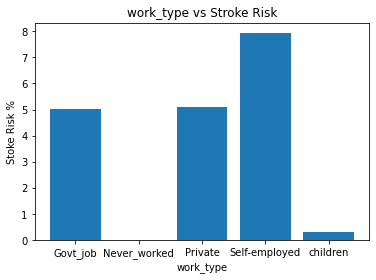

In [32]:
group = stroke.groupby(['work_type'], as_index=False).sum()
labels = ['Govt_job', 'Never_worked', 'Private', 'Self-employed', 'children']
grouped_graph('work_type', labels)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F8572481C0>,
      dtype=object)

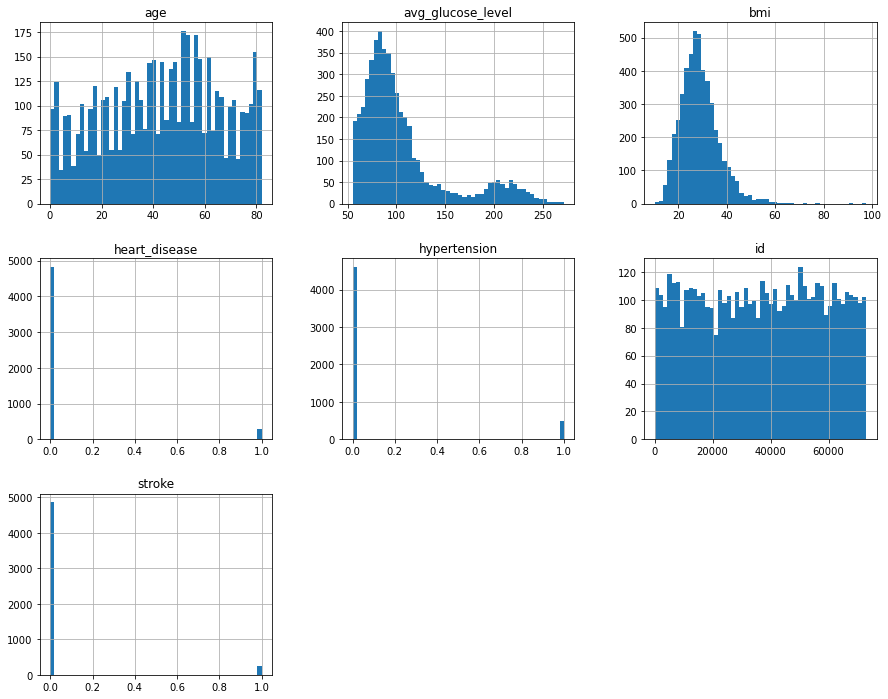

In [33]:
stroke.hist(bins=50, figsize=(15, 12))

In [34]:
for bmi,bmi_bmi in g:
    print(bmi)
    print(bmi_bmi)

10.3
         id  gender   age  hypertension  heart_disease ever_married work_type  \
1609  38043  Female  1.24             0              0           No  children   

     Residence_type  avg_glucose_level   bmi smoking_status  stroke  
1609          Rural             122.04  10.3        Unknown       0  
11.3
        id  gender   age  hypertension  heart_disease ever_married  \
3307  3205  Female  79.0             0              0          Yes   

          work_type Residence_type  avg_glucose_level   bmi smoking_status  \
3307  Self-employed          Urban              79.03  11.3        Unknown   

      stroke  
3307       0  
11.5
         id gender   age  hypertension  heart_disease ever_married work_type  \
2187  59993   Male  40.0             0              0          Yes   Private   

     Residence_type  avg_glucose_level   bmi smoking_status  stroke  
2187          Rural              60.96  11.5   never smoked       0  
12.0
        id  gender  age  hypertension  heart_dis

In [35]:
#Underweight = <18.5
#>>Normal weight = 18.5–24.9
#>>Overweight = 25–29.9
Underweight=stroke.loc[stroke.stroke<24.9]
print(Underweight['stroke'].value_counts())
print(Underweight['stroke'].mean())

0    4861
1     249
Name: stroke, dtype: int64
0.0487279843444227


In [36]:
index=stroke.loc[stroke.bmi>24.9]
Normal_weight=index.loc[index.bmi<29.9]
print(Normal_weight['stroke'].value_counts())
print(Normal_weight['stroke'].mean())

0    1311
1      72
Name: stroke, dtype: int64
0.052060737527114966


In [37]:
Overweight=stroke.loc[stroke.bmi>29.9]
print(Overweight['stroke'].value_counts())
print(Overweight['stroke'].mean())

0    1822
1      98
Name: stroke, dtype: int64
0.051041666666666666


we can see that in all the groups the percentage of who had a stroke is very low and those that belong to group "underweight" and had a stroke are more than the other groups


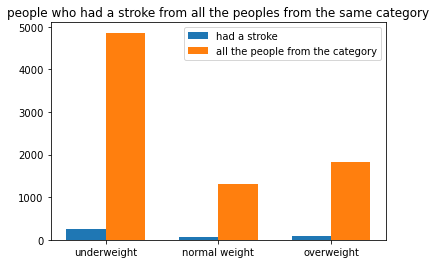

In [38]:
#so i decided to delet all the rows that have no information about the bmi
labels = ['underweight','normal weight','overweight']
had_stroke = [249, 72, 98]
stroke_means = [4861,1311,1822]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, had_stroke, width, label='had a stroke')
rects2 = ax.bar(x + width/2, stroke_means, width, label='all the people from the category')

# Add some text for labels, title and custom x-axis tick labels, etc.

ax.set_title('people who had a stroke from all the peoples from the same category')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()
print('we can see that in all the groups the percentage of who had a stroke is very low',
      'and those that belong to group "underweight" and had a stroke are more than the other groups')

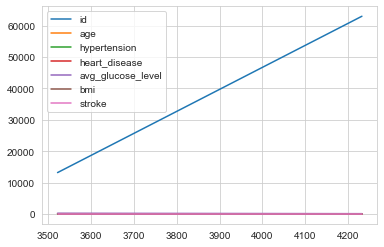

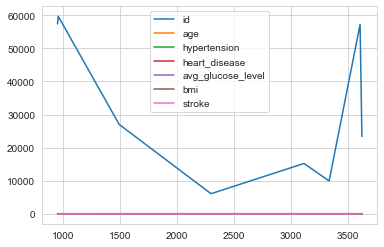

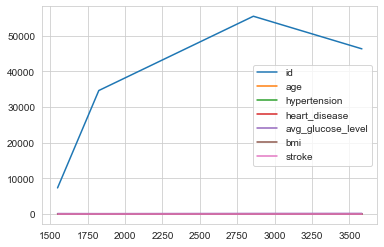

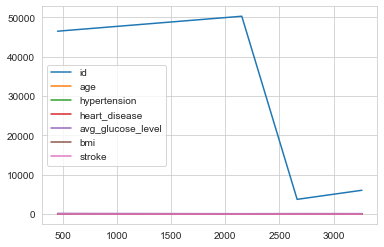

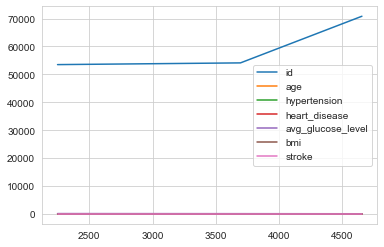

...

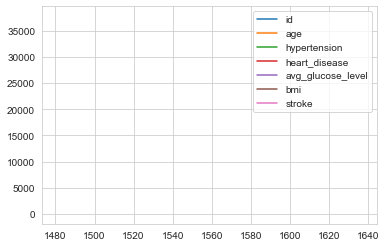

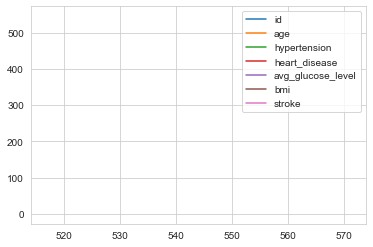

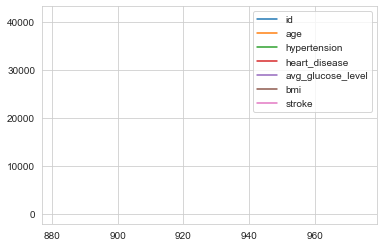

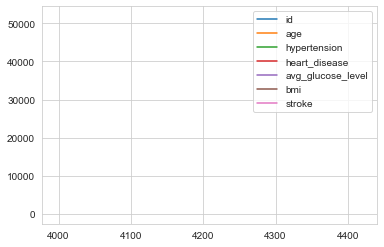

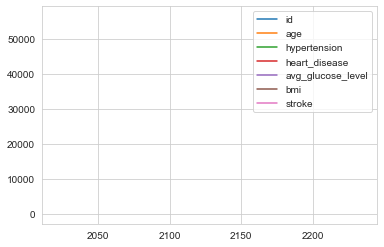

In [39]:
stroke["avg_glucose_level"].value_counts()

93.88     6
83.16     5
91.85     5
91.68     5
73.00     5
         ..
162.14    1
111.77    1
90.91     1
103.50    1
88.02     1
Name: avg_glucose_level, Length: 3979, dtype: int64

In [40]:
#Normal blood sugar levels are less than 100 mg/dL after not eating (fasting) for at least eight hours.
#And they're less than 140 mg/dL two hours after eating.
#During the day, levels tend to be at their lowest just before meals. 
#For most people without diabetes, blood sugar levels before meals hover around 70 to 80 mg/dL. 
#For some people, 60 is normal; for others, 90 is the norm.

In [41]:
df3=stroke.groupby('avg_glucose_level').age.value_counts().unstack
df3

<bound method Series.unstack of avg_glucose_level  age 
55.12              21.0    1
55.22              42.0    1
55.23              66.0    1
55.25              20.0    1
55.26              61.0    1
                          ..
266.59             60.0    1
267.60             76.0    1
267.61             76.0    1
267.76             49.0    1
271.74             68.0    1
Name: age, Length: 5091, dtype: int64>

In [42]:
group1=stroke.loc[stroke.age<25]
group1['stroke'].value_counts()

0    1234
1       2
Name: stroke, dtype: int64

In [43]:
group11=stroke.loc[stroke.age>25]
group2=group11.loc[group11.age<45]
group2['stroke'].value_counts()

0    1232
1       8
Name: stroke, dtype: int64

In [44]:
group3=stroke.loc[stroke.age>45]
group3['stroke'].value_counts()

0    2256
1     236
Name: stroke, dtype: int64

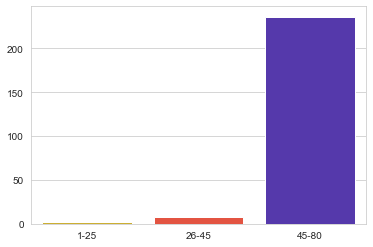

In [45]:
sns.set_style("whitegrid")
sns.barplot(["1-25",'26-45','45-80'],
            y=[2,8,236],
            palette="CMRmap_r"
           )
#we can see that people older than 45 are more likley to have a stroke

In [46]:
r=stroke.loc[stroke.Residence_type=='Rural']
print(r['stroke'].value_counts())
print(114/2400)

0    2400
1     114
Name: stroke, dtype: int64
0.0475


In [47]:
j=r=stroke.loc[stroke.Residence_type=='Urban']
print(j['stroke'].value_counts())
print(135/2461)

0    2461
1     135
Name: stroke, dtype: int64
0.054855749695245835


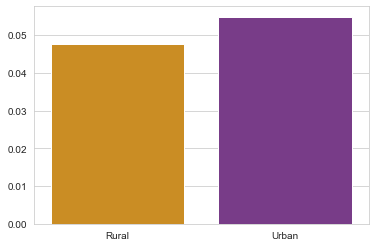

In [48]:
sns.set_style("whitegrid")
sns.barplot(["Rural",'Urban'],
            y=[0.0475,0.054855749695245835],
            palette="CMRmap_r"
           )

In [49]:
df3

<bound method Series.unstack of avg_glucose_level  age 
55.12              21.0    1
55.22              42.0    1
55.23              66.0    1
55.25              20.0    1
55.26              61.0    1
                          ..
266.59             60.0    1
267.60             76.0    1
267.61             76.0    1
267.76             49.0    1
271.74             68.0    1
Name: age, Length: 5091, dtype: int64>

In [50]:

x=stroke.loc[stroke.avg_glucose_level<60]
x['stroke'].value_counts()
print(8/12)

0.6666666666666666


In [51]:
index=stroke.loc[stroke.avg_glucose_level>59]
x1=index.loc[index.avg_glucose_level<90]
x1['stroke'].value_counts()
print(83/2144)

0.03871268656716418


In [52]:
x2=stroke.loc[stroke.avg_glucose_level>89]
x2['stroke'].value_counts()
print(164/2623)

0.06252382767823103


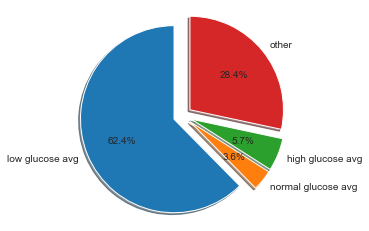

In [53]:
labels = 'low glucose avg', 'normal glucose avg', 'high glucose avg','other'
sizes = [0.66,0.038, 0.06,0.3]
explode = (0.1,0.1,0.1,0.1)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [54]:
stroke

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


In [55]:
stroke['smoking_status'].value_counts()

never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: smoking_status, dtype: int64

In [56]:
formerly_smoked=stroke.loc[stroke.smoking_status=='formerly smoked']
formerly_smoked['stroke'].value_counts()

0    815
1     70
Name: stroke, dtype: int64

In [57]:
smokes=stroke.loc[stroke.smoking_status=='smokes']
smokes['stroke'].value_counts()

0    747
1     42
Name: stroke, dtype: int64

In [58]:
never_smoked=stroke.loc[stroke.smoking_status=='never smoke']
never_smoked['stroke'].value_counts()

Series([], Name: stroke, dtype: int64)

Text(0.5, 0.98, 'how smokes effect having stroke')

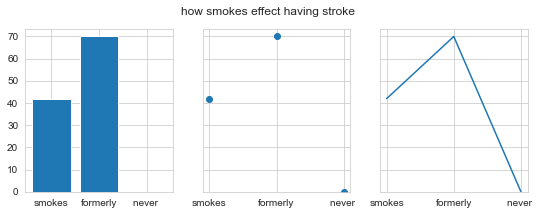

In [59]:

data = {'smokes': 42, 'formerly': 70, 'never ': 0}
names = list(data.keys())
values = list(data.values())

fig, axs = plt.subplots(1, 3, figsize=(9, 3), sharey=True)
axs[0].bar(names, values)
axs[1].scatter(names, values)
axs[2].plot(names, values)
fig.suptitle('how smokes effect having stroke')

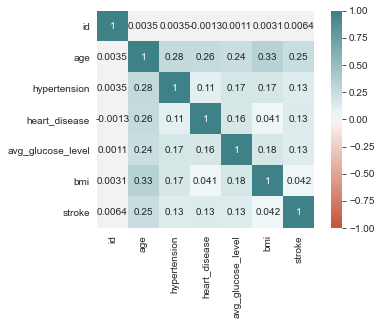

In [60]:
corr = stroke.corr()
sns.heatmap(corr,vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 200, n=200),
            square=True,annot=True)
plt.show()

In [61]:
df122=stroke.drop(['id'], axis=1)

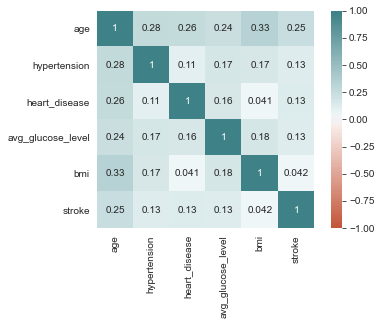

In [62]:
corr = df122.corr()
sns.heatmap(corr,vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 200, n=200),
            square=True,annot=True)
plt.show()

In [63]:
stroke["work_type"].value_counts()

Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: work_type, dtype: int64

In [64]:
zero_nan=["bmi"]

In [65]:
for column in zero_nan:
    stroke[column]= stroke[column].replace(np.nan,0)
    mean=int( stroke[column].mean(skipna=True))
    stroke[column]= stroke[column].replace(0,mean)

In [66]:
#prediction:first we have to convert all the data to numerical data
pre_df=stroke
pre_df.replace(['Male','Female'],[1,2],inplace=True)
pre_df.replace(['Urban','Rural'],[0,1],inplace=True)
pre_df.replace(['never smoked','formerly smoked','smokes','Unknown'],[1,2,3,4],inplace=True)
pre_df.replace(['Private','Self-employed','children','Govt_job','Never_worked'],[1,2,3,4,5],inplace=True)
pre_df.replace(['Yes','No'],[1,0],inplace=True)
pre_df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,1,0,228.69,36.6,2,1
1,51676,2,61.0,0,0,1,2,1,202.21,27.0,1,1
2,31112,1,80.0,0,1,1,1,1,105.92,32.5,1,1
3,60182,2,49.0,0,0,1,1,0,171.23,34.4,3,1
4,1665,2,79.0,1,0,1,2,1,174.12,24.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,2,80.0,1,0,1,1,0,83.75,27.0,1,0
5106,44873,2,81.0,0,0,1,2,0,125.20,40.0,1,0
5107,19723,2,35.0,0,0,1,2,1,82.99,30.6,1,0
5108,37544,1,51.0,0,0,1,1,1,166.29,25.6,2,0


In [67]:
for label, content in pre_df.items():
    if pd.api.types.is_string_dtype(content):
        pre_df[label] = content.astype("category").cat.as_ordered()

In [68]:
for label, content in x.items():
    if pd.api.types.is_string_dtype(content):
        print(label)


gender
ever_married
work_type
Residence_type
smoking_status


In [69]:
for label, content in pre_df.items():
    if not pd.api.types.is_numeric_dtype(content):
        pre_df[label] = pd.Categorical(content).codes+1 

In [70]:
for label, content in x.items():
    if pd.api.types.is_string_dtype(content):
        print(label)

gender
ever_married
work_type
Residence_type
smoking_status


In [71]:
pre_df.shape

(5110, 12)

In [72]:
stroke

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,1,0,228.69,36.6,2,1
1,51676,2,61.0,0,0,1,2,1,202.21,27.0,1,1
2,31112,1,80.0,0,1,1,1,1,105.92,32.5,1,1
3,60182,2,49.0,0,0,1,1,0,171.23,34.4,3,1
4,1665,2,79.0,1,0,1,2,1,174.12,24.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,2,80.0,1,0,1,1,0,83.75,27.0,1,0
5106,44873,2,81.0,0,0,1,2,0,125.20,40.0,1,0
5107,19723,2,35.0,0,0,1,2,1,82.99,30.6,1,0
5108,37544,1,51.0,0,0,1,1,1,166.29,25.6,2,0


In [256]:
#split the dataset
x=pre_df.iloc[:,:11]
y=pre_df.iloc[:,11]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

In [257]:
for label, content in pre_df.items():
    if pd.api.types.is_string_dtype(content):
        print(label)


In [258]:
for label, content in pre_df.items():
    if pd.api.types.is_string_dtype(content):
        pre_df[label] = content.astype("category").cat.as_ordered()


In [259]:
for label, content in x.items():
    if pd.api.types.is_string_dtype(content):
        print(label)


In [260]:
for label, content in pre_df.items():
    if not pd.api.types.is_numeric_dtype(content):
        pre_df[label] = pd.Categorical(content).codes+1 

In [261]:
for label, content in x.items():
    if pd.api.types.is_string_dtype(content):
        print(label)


In [262]:
pre_df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,1,67.0,0,1,1,1,0,228.69,36.6,2,1
1,51676,2,61.0,0,0,1,2,1,202.21,27.0,1,1
2,31112,1,80.0,0,1,1,1,1,105.92,32.5,1,1
3,60182,2,49.0,0,0,1,1,0,171.23,34.4,3,1
4,1665,2,79.0,1,0,1,2,1,174.12,24.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,2,80.0,1,0,1,1,0,83.75,27.0,1,0
5106,44873,2,81.0,0,0,1,2,0,125.20,40.0,1,0
5107,19723,2,35.0,0,0,1,2,1,82.99,30.6,1,0
5108,37544,1,51.0,0,0,1,1,1,166.29,25.6,2,0


In [263]:
knn = KNeighborsClassifier(n_neighbors = 5) # We'll use the default number of neighbors.
knn.fit(X_train,y_train)
predicted_y = knn.predict(X_test)
print('K=5 accuracy score: ',knn.score(X_test,y_test))

K=5 accuracy score:  0.9478147423352903


Text(0, 0.5, 'Accuracy')

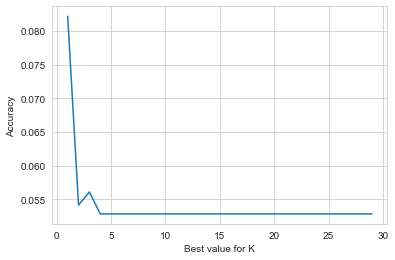

In [264]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)
err_rate=[] 
for i in range(1,30):
    k=KNeighborsClassifier(n_neighbors=i)
    k.fit(X_train,y_train)
    bestK=k.predict(X_test)
    err_rate.append(np.mean(bestK != y_test))

plt.plot(range(1,30),err_rate)
plt.xlabel('Best value for K')
plt.ylabel('Accuracy')

Text(0, 0.5, 'Accuracy')

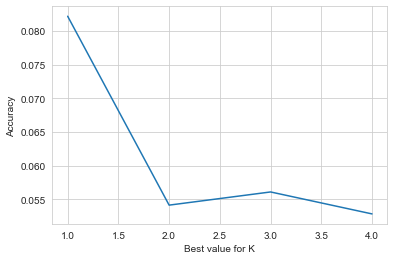

In [265]:
err_rate=[] 
for i in range(1,5):
    k=KNeighborsClassifier(n_neighbors=i)
    k.fit(X_train,y_train)
    bestK=k.predict(X_test)
    err_rate.append(np.mean(bestK != y_test))

plt.plot(range(1,5),err_rate)
plt.xlabel('Best value for K')
plt.ylabel('Accuracy')

In [180]:
len(y)

5110

In [181]:
classifier=KNeighborsClassifier(n_neighbors=3)

In [182]:
classifier.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [183]:
y_pred=classifier.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [184]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[1463,    8],
       [  61,    1]], dtype=int64)

In [185]:
from sklearn.metrics import f1_score,accuracy_score
f1_score(y_test,y_pred)

0.028169014084507043

In [186]:
accuracy_score(y_test,y_pred)

0.9549902152641878

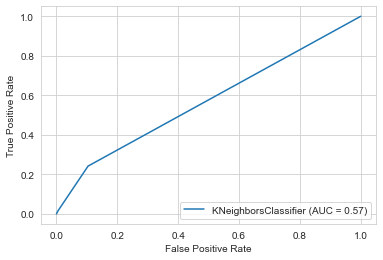

In [187]:
metrics.plot_roc_curve(classifier, X_test, y_test)  
plt.show()

In [188]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98      1471
           1       0.11      0.02      0.03        62

    accuracy                           0.95      1533
   macro avg       0.54      0.51      0.50      1533
weighted avg       0.93      0.95      0.94      1533



In [189]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9575994781474233

In [190]:
from sklearn.metrics import roc_curve

# make predictions with probabilities
X_train, X_test, y_train, y_test= train_test_split(x, y, test_size=0.2)
clf.fit(X_train, y_train)

y_probs = clf.predict_proba(X_test)
y_probs[:10]

array([[0.99, 0.01],
       [0.91, 0.09],
       [0.99, 0.01],
       [1.  , 0.  ],
       [0.99, 0.01],
       [0.99, 0.01],
       [1.  , 0.  ],
       [0.78, 0.22],
       [0.97, 0.03],
       [0.68, 0.32]])

In [191]:
#import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

#Setup arrays to store training and test accuracies
neighbors = np.arange(1,9)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test) 

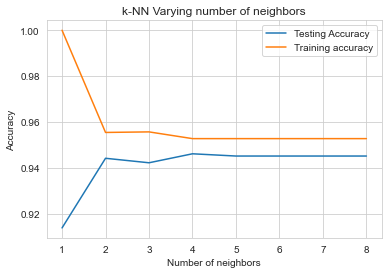

In [192]:
#Generate plot
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [193]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,auc,roc_auc_score,precision_score,recall_score

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       966
           1       0.17      0.18      0.18        56

    accuracy                           0.91      1022
   macro avg       0.56      0.56      0.56      1022
weighted avg       0.91      0.91      0.91      1022

0.9080234833659491
[[918  48]
 [ 46  10]]
precision =  0.1724137931034483 
 recall =  0.17857142857142858


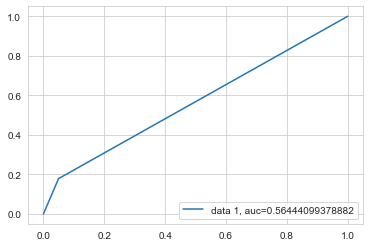

                   Importance
id                   0.224603
avg_glucose_level    0.208427
bmi                  0.179303
age                  0.175517
smoking_status       0.069175
work_type            0.039109
heart_disease        0.029115
gender               0.024102
hypertension         0.020988
Residence_type       0.017333
ever_married         0.012328


In [194]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

pred = dtree.predict(X_test)
print(classification_report(y_test,pred))
print (accuracy_score(y_test,pred))
print (confusion_matrix(y_test,pred))

precision = precision_score(y_test,pred)
recall = recall_score(y_test,pred)
print( 'precision = ', precision, '\n', 'recall = ', recall)

y_pred_proba = dtree.predict_proba(X_test)[::,1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

impFeatures = pd.DataFrame(dtree.feature_importances_ ,index=pre_df.loc[:,pre_df.columns!='stroke'].columns,columns=['Importance']).sort_values(by='Importance',ascending=False)
print (impFeatures)

In [2]:
houses_Brazil=pd.read_csv(r"C:\Users\2031\Desktop\houses_to_rent_v2.csv")
houses_Brazil

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973
2,Porto Alegre,80,1,1,1,6,acept,not furnished,1000,2800,0,41,3841
3,Porto Alegre,51,2,1,0,2,acept,not furnished,270,1112,22,17,1421
4,São Paulo,25,1,1,0,1,not acept,not furnished,0,800,25,11,836
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10687,Porto Alegre,63,2,1,1,5,not acept,furnished,402,1478,24,22,1926
10688,São Paulo,285,4,4,4,17,acept,not furnished,3100,15000,973,191,19260
10689,Rio de Janeiro,70,3,3,0,8,not acept,furnished,980,6000,332,78,7390
10690,Rio de Janeiro,120,2,2,2,8,acept,furnished,1585,12000,279,155,14020


In [3]:
houses_Brazil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10692 entries, 0 to 10691
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   city                 10692 non-null  object
 1   area                 10692 non-null  int64 
 2   rooms                10692 non-null  int64 
 3   bathroom             10692 non-null  int64 
 4   parking spaces       10692 non-null  int64 
 5   floor                10692 non-null  object
 6   animal               10692 non-null  object
 7   furniture            10692 non-null  object
 8   hoa (R$)             10692 non-null  int64 
 9   rent amount (R$)     10692 non-null  int64 
 10  property tax (R$)    10692 non-null  int64 
 11  fire insurance (R$)  10692 non-null  int64 
 12  total (R$)           10692 non-null  int64 
dtypes: int64(9), object(4)
memory usage: 1.1+ MB


In [4]:
for label, content in houses_Brazil.items():
    if pd.api.types.is_string_dtype(content):
        print(label)


city
floor
animal
furniture


In [5]:
for label, content in houses_Brazil.items():
    if pd.api.types.is_string_dtype(content):
        houses_Brazil[label] = content.astype("category").cat.as_ordered()


In [6]:
for label, content in houses_Brazil.items():
    if not pd.api.types.is_numeric_dtype(content):
        houses_Brazil[label] = pd.Categorical(content).codes+1 

In [7]:
houses_Brazil.describe()

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
count,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,1.069200e+04,10692.000000,10692.000000,10692.000000,1.069200e+04
mean,3.926487,149.217920,2.506079,2.236813,1.609147,14.620932,1.222222,1.756266,1.174022e+03,3896.247194,366.704358,53.300879,5.490487e+03
std,1.426535,537.016942,1.171266,1.407198,1.589521,12.992499,0.415759,0.429354,1.559231e+04,3408.545518,3107.832321,47.768031,1.648473e+04
min,1.000000,11.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000e+00,450.000000,0.000000,3.000000,4.990000e+02
25%,3.000000,56.000000,2.000000,1.000000,0.000000,2.000000,1.000000,2.000000,1.700000e+02,1530.000000,38.000000,21.000000,2.061750e+03
50%,5.000000,90.000000,2.000000,2.000000,1.000000,13.000000,1.000000,2.000000,5.600000e+02,2661.000000,125.000000,36.000000,3.581500e+03
75%,5.000000,182.000000,3.000000,3.000000,2.000000,28.000000,1.000000,2.000000,1.237500e+03,5000.000000,375.000000,68.000000,6.768000e+03
max,5.000000,46335.000000,13.000000,10.000000,12.000000,35.000000,2.000000,2.000000,1.117000e+06,45000.000000,313700.000000,677.000000,1.120000e+06


In [8]:
missing_values = houses_Brazil.isnull().sum()
missing_values

city                   0
area                   0
rooms                  0
bathroom               0
parking spaces         0
floor                  0
animal                 0
furniture              0
hoa (R$)               0
rent amount (R$)       0
property tax (R$)      0
fire insurance (R$)    0
total (R$)             0
dtype: int64

In [9]:
char_nan=['floor']

In [10]:
for column in char_nan:
    houses_Brazil[column]= houses_Brazil[column].replace('-',0)
    mean=int( houses_Brazil[column].mean(skipna=True))
    houses_Brazil[column]= houses_Brazil[column].replace(0,mean)

In [11]:
houses_Brazil['floor'].value_counts()

1     2461
2     1081
13     985
24     931
28     748
30     600
32     539
33     497
34     490
35     369
3      357
4      303
5      257
6      200
7      170
8      147
9      109
10      96
11      75
12      53
14      44
15      42
19      25
17      25
16      24
20      20
18      19
21       8
22       6
23       5
26       2
31       1
25       1
29       1
27       1
Name: floor, dtype: int64

In [12]:
houses_Brazil.corr()['rent amount (R$)'].sort_values(ascending=False)

rent amount (R$)       1.000000
fire insurance (R$)    0.987343
bathroom               0.668504
parking spaces         0.578361
rooms                  0.541758
total (R$)             0.264490
city                   0.188571
area                   0.180742
property tax (R$)      0.107884
hoa (R$)               0.036490
animal                -0.067754
floor                 -0.098388
furniture             -0.164235
Name: rent amount (R$), dtype: float64

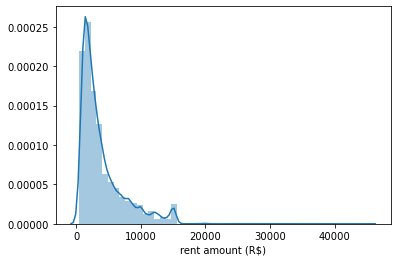

In [13]:
 sns.distplot(houses_Brazil['rent amount (R$)'])

In [14]:
print("Skewness: %f" % houses_Brazil['rent amount (R$)'].skew())
print("Kurtosis: %f" % houses_Brazil['rent amount (R$)'].kurt())

Skewness: 1.838877
Kurtosis: 4.624228


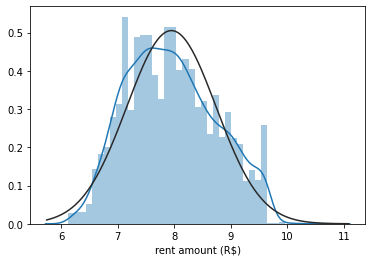

In [15]:
 from scipy.stats import norm, skew
houses_Brazil['rent amount (R$)'] = np.log1p( houses_Brazil['rent amount (R$)'])
sns.distplot( houses_Brazil['rent amount (R$)'], fit=norm);

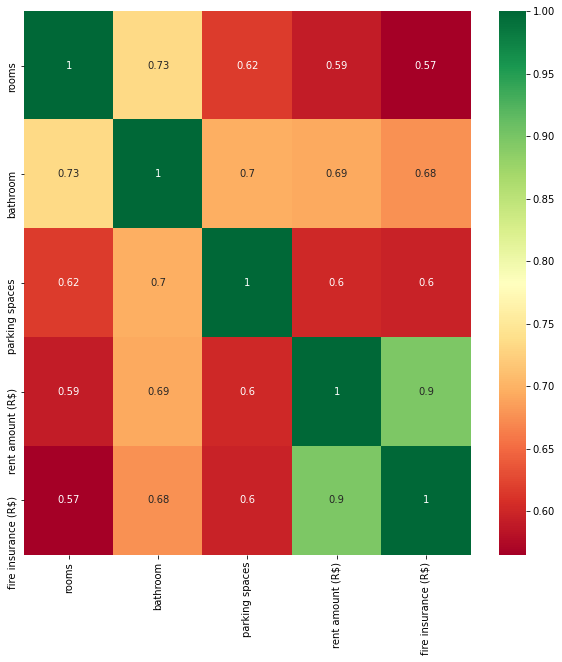

In [16]:
corr =houses_Brazil.corr()
highest_corr_features = corr.index[abs(corr["rent amount (R$)"])>0.5] # Why
plt.figure(figsize=(10,10))
g = sns.heatmap(houses_Brazil[highest_corr_features].corr(),annot=True,cmap="RdYlGn")

In [17]:
houses_Brazil.corr()['rent amount (R$)'].sort_values(ascending=False)

rent amount (R$)       1.000000
fire insurance (R$)    0.897975
bathroom               0.693440
parking spaces         0.601840
rooms                  0.591980
city                   0.259179
total (R$)             0.246480
area                   0.177024
property tax (R$)      0.100436
hoa (R$)               0.038012
floor                 -0.076049
animal                -0.082826
furniture             -0.211923
Name: rent amount (R$), dtype: float64

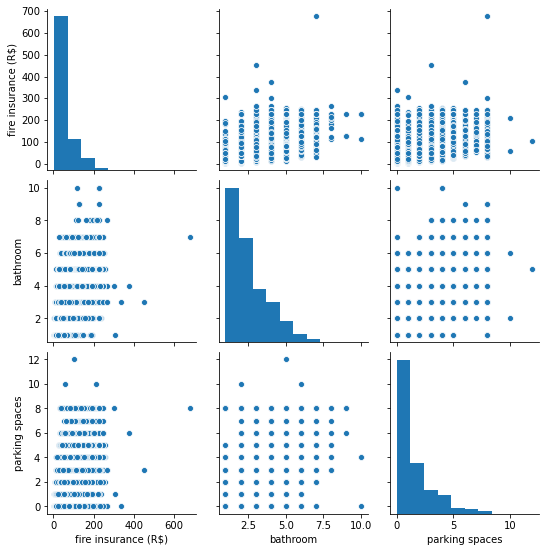

In [18]:
features = ['fire insurance (R$)','bathroom','parking spaces']
sns.pairplot(houses_Brazil[features])


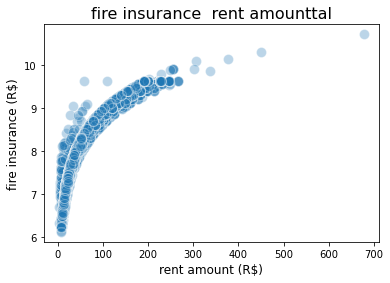

In [19]:
plt.scatter(x ='fire insurance (R$)', y = 'rent amount (R$)', data =houses_Brazil , s = 100, alpha = 0.3, edgecolor = 'white');
plt.title('fire insurance  rent amounttal', fontsize = 16);
plt.ylabel('fire insurance (R$)', fontsize = 12);
plt.xlabel('rent amount (R$)', fontsize = 12);

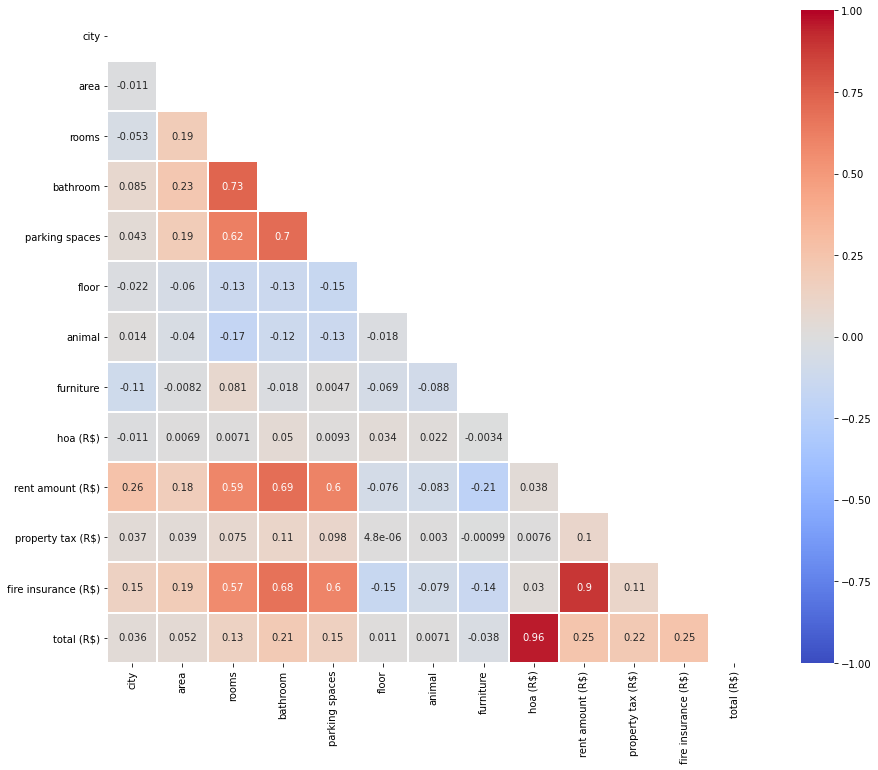

In [20]:
correlation_02 = houses_Brazil.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_02, cmap="coolwarm", center=0, annot=True,vmin=-1, vmax=1,linewidth=1, linecolor='w', square=True,mask= np.triu(correlation_02));

In [21]:
x =houses_Brazil["fire insurance (R$)"].values.reshape(-1,1)
y = houses_Brazil["rent amount (R$)"].values.reshape(-1,1)

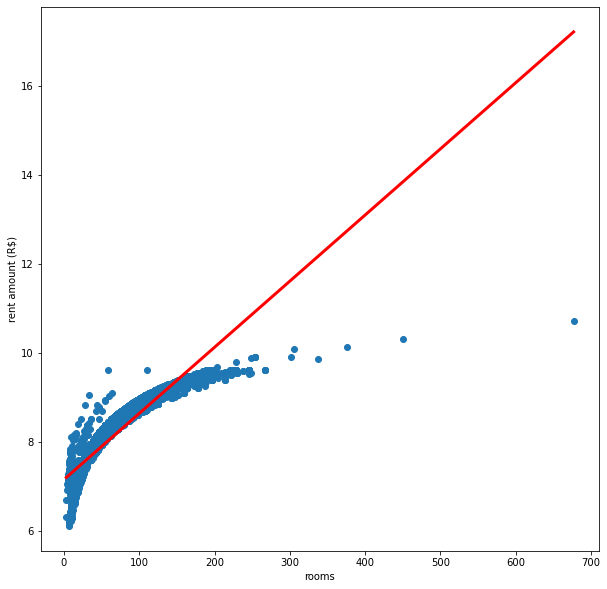

R^2 Score: 0.8063583613751468


In [22]:

linear_regression_model = LinearRegression()
linear_regression_model.fit(x,y)

# Prediction
x_space = np.linspace(min(x), max(x)).reshape(-1,1)
predicted_y = linear_regression_model.predict(x_space)

# Plotting regression line and scatter
plt.figure(figsize=[10,10])
plt.scatter(x=x, y=y)
plt.plot(x_space, predicted_y, color="red", linewidth=3)
plt.xlabel("rooms")
plt.ylabel("rent amount (R$)")
plt.show()

# R^2 Score 
print("R^2 Score: {}".format(linear_regression_model.score(x,y)))

In [23]:
houses_Brazil

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
0,5,70,2,1,1,33,1,1,2065,8.101981,211,42,5618
1,5,320,4,4,0,14,1,2,1200,8.509363,1750,63,7973
2,3,80,1,1,1,32,1,2,1000,7.937732,0,41,3841
3,3,51,2,1,0,13,1,2,270,7.014814,22,17,1421
4,5,25,1,1,0,2,2,2,0,6.685861,25,11,836
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10687,3,63,2,1,1,30,2,1,402,7.299121,24,22,1926
10688,5,285,4,4,4,10,1,2,3100,9.615872,973,191,19260
10689,4,70,3,3,0,34,2,1,980,8.699681,332,78,7390
10690,4,120,2,2,2,34,1,1,1585,9.392745,279,155,14020


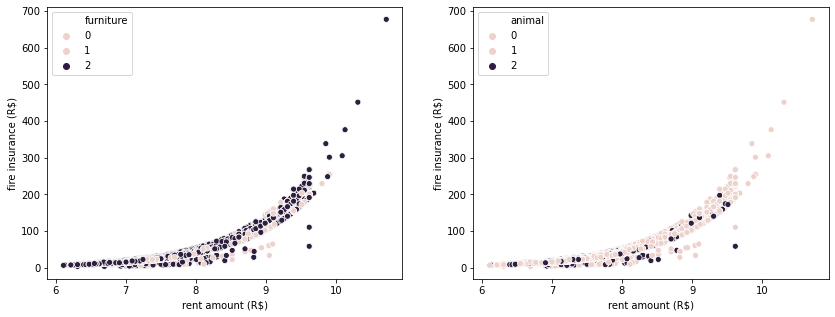

In [24]:
fig, axes = plt.subplots(1,2, figsize=(14,5))
sns.scatterplot(data=houses_Brazil, y='fire insurance (R$)', x='rent amount (R$)', 
                hue="furniture", ax=axes[0]);
sns.scatterplot(data=houses_Brazil, y='fire insurance (R$)', x='rent amount (R$)',
                hue="animal", ax=axes[1]);

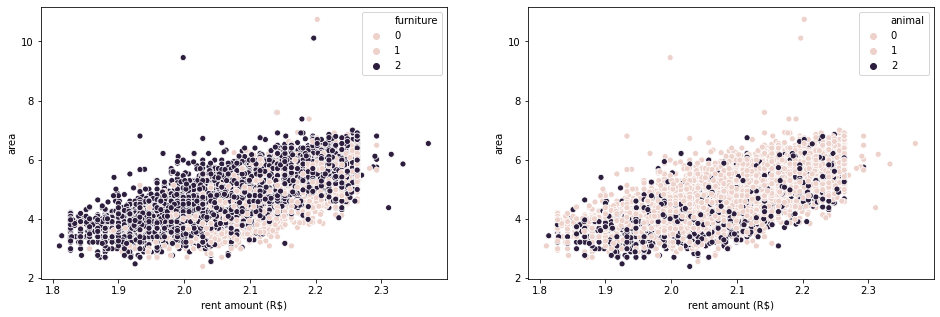

In [25]:
fig, axes = plt.subplots(1,2, figsize=(16,5))
sns.scatterplot(data=houses_Brazil, y=np.log(houses_Brazil['area']), x=np.log(houses_Brazil['rent amount (R$)']), 
                hue="furniture", ax=axes[0]);
sns.scatterplot(data=houses_Brazil, y=np.log(houses_Brazil['area']), x=np.log(houses_Brazil['rent amount (R$)']), 
                hue="animal", ax=axes[1]);


In [27]:
x=houses_Brazil.iloc[:,:12]
y=houses_Brazil.iloc[:,12]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3)

In [28]:
X_test.shape , X_train.shape

((3208, 12), (7484, 12))

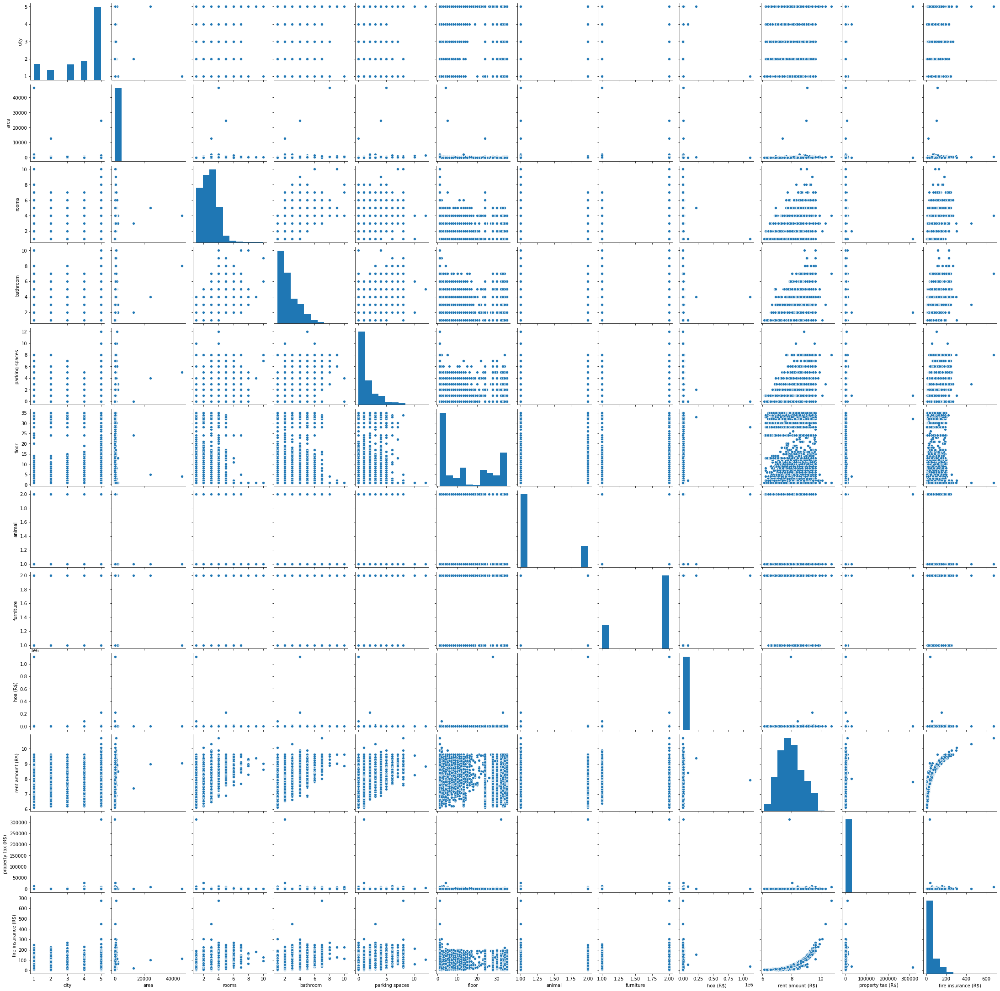

In [29]:
sns.pairplot(X_train);

In [30]:
houses_Brazil.columns

Index(['city', 'area', 'rooms', 'bathroom', 'parking spaces', 'floor',
       'animal', 'furniture', 'hoa (R$)', 'rent amount (R$)',
       'property tax (R$)', 'fire insurance (R$)', 'total (R$)'],
      dtype='object')

In [34]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [35]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
print("MAE:", mean_absolute_error(y_test, y_pred))
linModel = LinearRegression().fit(X_train,y_train)
print("Score:" ,linModel.score(X_train,y_train))
lin_scores = cross_val_score(linModel, x, y, cv=5)
print("Cross Validation scores mean:",lin_scores.mean())

MAE: 296.6034702237181
Score: 0.999043504556092
Cross Validation scores mean: 0.9955973702971193
